# Computer Vision Lab: Object Detection using YoloV5

## Setup & Installation

### Setup

In [ ]:
# !sudo apt update
# !sudo apt install git   # "if you don't have it"
# !sudo apt install -y python3 python3-pip    # "if you don't have it"

###  Clone YOLOv5 Repository

In [ ]:
# !git clone https://github.com/ultralytics/yolov5.git
# %cd yolov5


### Install YOLOv5 Dependencies

In [ ]:
# !pip install -U -r requirements.txt

### Directory Structure

- YOLOv5’s directory structure includes several important folders:

    - data/: Contains datasets and configuration files. For example, data/images/ is where your images should be placed for detection.

    - models/: Includes pre-trained model configurations and weights. You can find YOLOv5 model definitions here, like yolov5s.yaml.

    - runs/: Stores the output of your detection runs. After running detection, the results are saved in directories such as runs/detect/exp/.

    - utils/: Contains utility scripts used by YOLOv5, including functions for parsing arguments, logging, and drawing bounding boxes.

    - data.yaml: A configuration file that defines dataset paths and class names for training and evaluation.

    - detect.py: The main script used for performing object detection. You can run this script with various arguments to detect objects in images or videos.

## Object detection using Web Cam

In [2]:
# !python detect.py --source 0  #change the source number depnding on number of cams
# !python detect.py --weights yolov5x.pt --source 0
# For more info go to detect.py 

## Model Usage 

In [9]:
import torch
from pathlib import Path
from IPython.display import Image, display
import matplotlib.pyplot as plt
import os
import cv2



In [10]:
# Load YOLOv5 model (choose a model size: small 's', medium 'm', large 'l', or extra-large 'x')
model_5s = torch.hub.load('ultralytics/yolov5', 'yolov5s')  # or 'yolov5m', 'yolov5l', 'yolov5x'

Using cache found in /home/samsepi0l/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-12-21 Python-3.10.12 torch-2.5.1+cu124 CUDA:0 (NVIDIA GeForce RTX 4050 Laptop GPU, 5897MiB)

100%|██████████| 14.1M/14.1M [00:11<00:00, 1.24MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


In [11]:
print(model_5s)

AutoShape(
  (model): DetectMultiBackend(
    (model): DetectionModel(
      (model): Sequential(
        (0): Conv(
          (conv): Conv2d(3, 32, kernel_size=(6, 6), stride=(2, 2), padding=(2, 2))
          (act): SiLU(inplace=True)
        )
        (1): Conv(
          (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (act): SiLU(inplace=True)
        )
        (2): C3(
          (cv1): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv2): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv3): Conv(
            (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (m): Sequential(
            (0): Bottleneck(
              (cv1): Conv(
                (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1))
  

In [12]:
print(model_5s.names)

{0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted plant', 59: 'bed', 60: 'dining table', 61: 'toilet', 62: 'tv', 63: 'laptop', 64: 'mouse', 65: 'remote', 66: 'keyboard', 67: 'cell phone', 68: 'microw

/home/samsepi0l/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


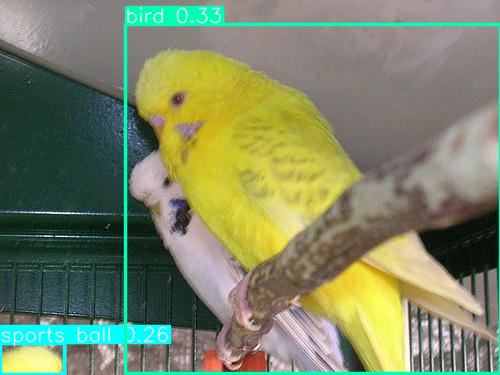

/home/samsepi0l/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


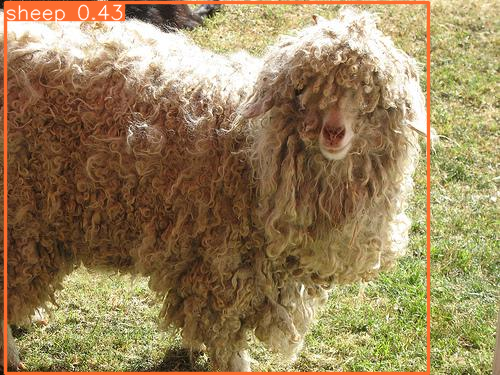

/home/samsepi0l/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


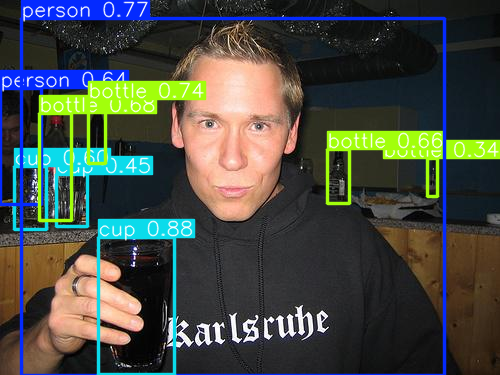

/home/samsepi0l/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


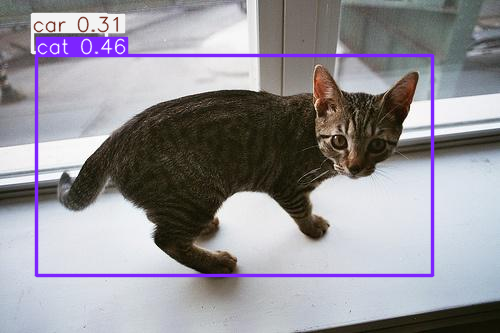

/home/samsepi0l/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


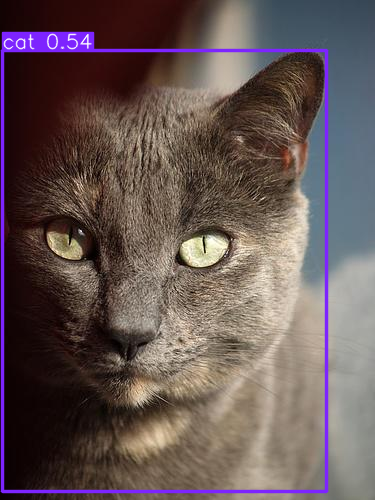

In [13]:
# Define the folder containing the images
image_folder = Path('/home/samsepi0l/TErm 7/CV/yolo/ex1')

# Get the list of image files
image_files = [f for f in os.listdir(image_folder) if f.endswith('.jpg')][:5]

# Process each image file
for image_file in image_files:
    img_path = str(image_folder / image_file)
    results = model_5s(img_path)
    results.show()

In [4]:
%matplotlib inline

Using cache found in /home/samsepi0l/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-12-21 Python-3.10.12 torch-2.5.1+cu124 CUDA:0 (NVIDIA GeForce RTX 4050 Laptop GPU, 5897MiB)

Fusing layers... 
YOLOv5x summary: 444 layers, 86705005 parameters, 0 gradients, 205.5 GFLOPs
Adding AutoShape... 
/home/samsepi0l/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


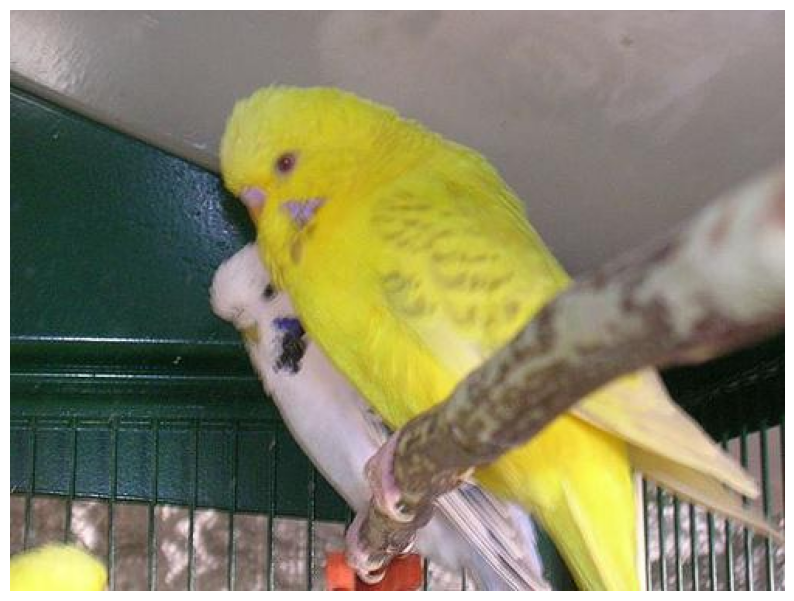

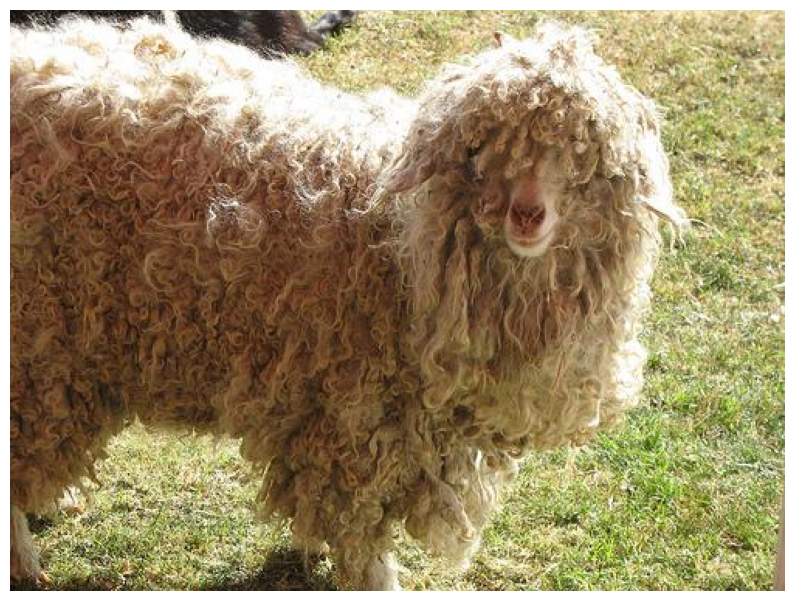

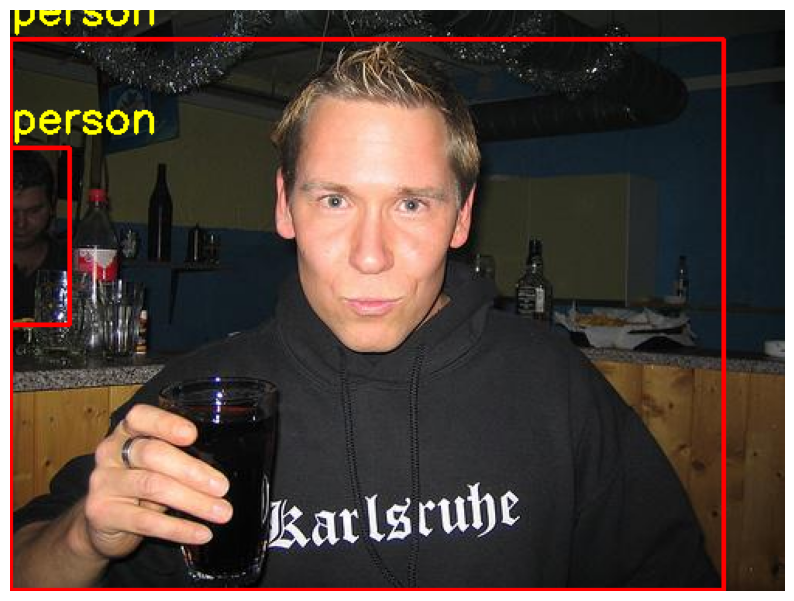

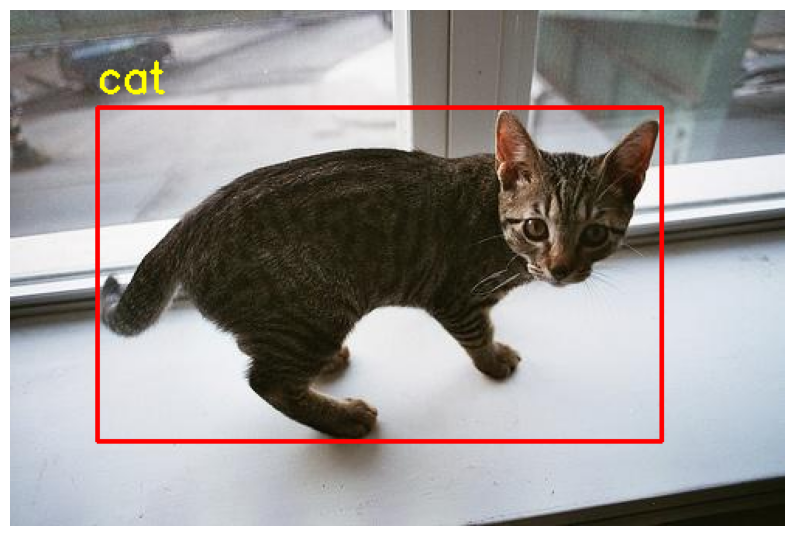

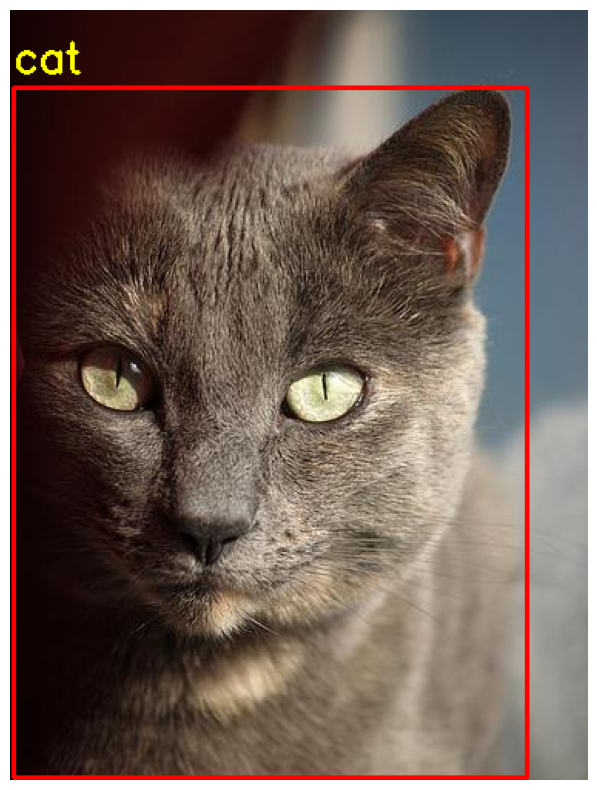

...

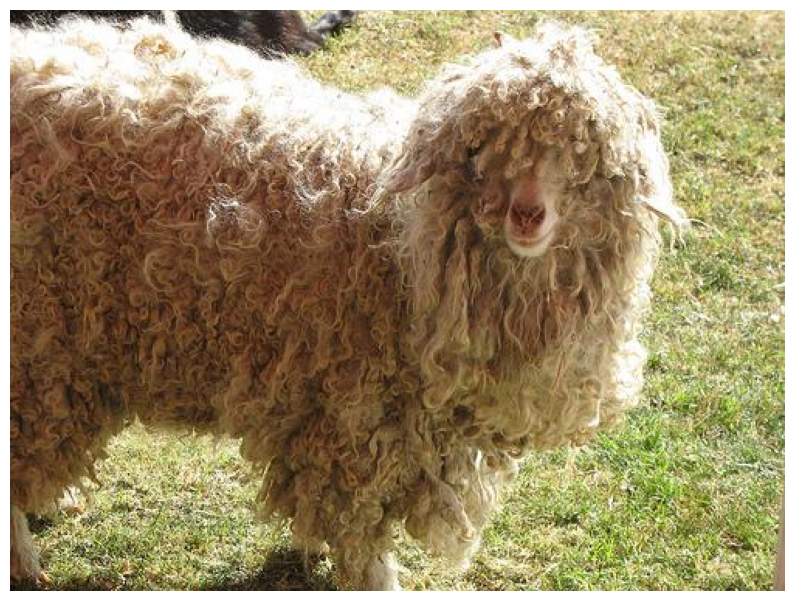

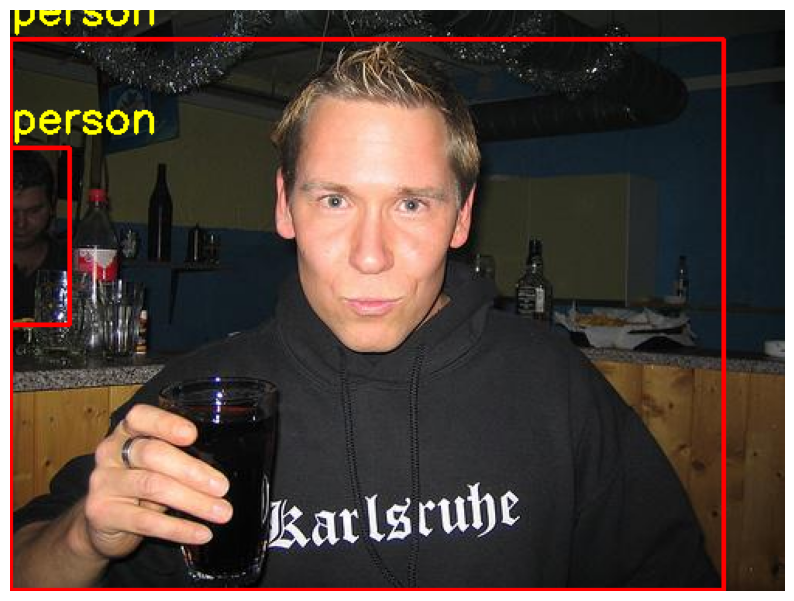

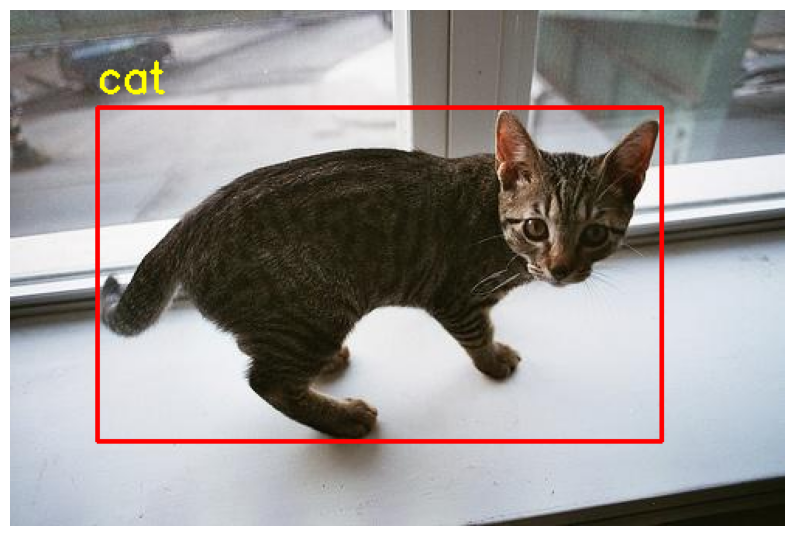

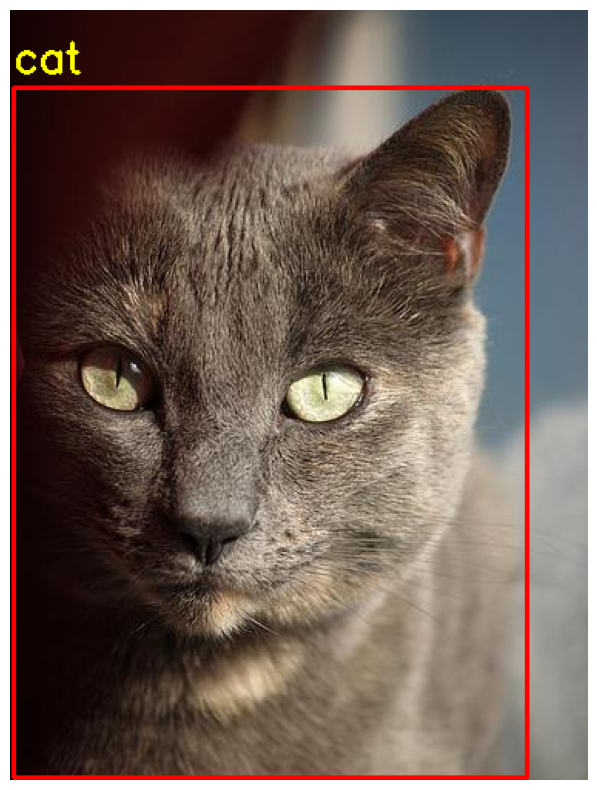

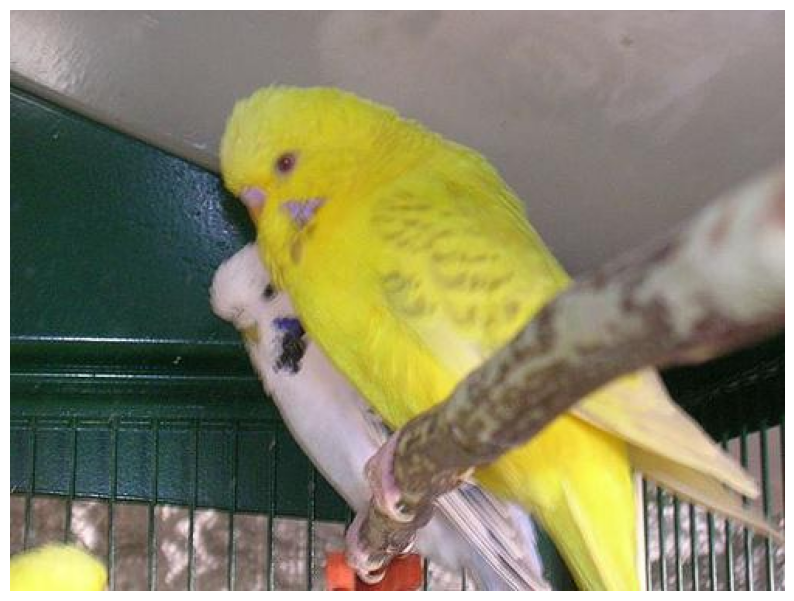

/home/samsepi0l/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


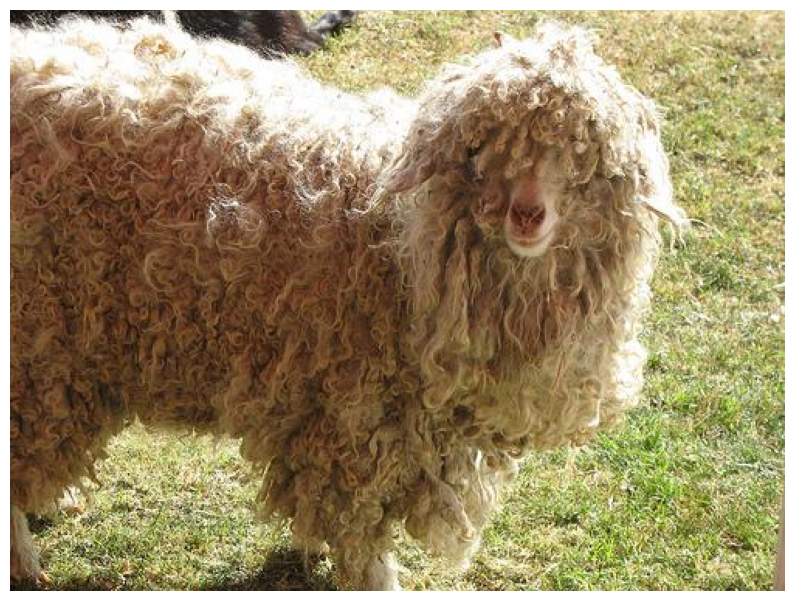

/home/samsepi0l/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


Detected: person at 0.0, 19.01210594177246, 460.0273132324219, 374.450439453125
Detected: person at 0.1500532031059265, 89.08112335205078, 38.79149627685547, 203.01742553710938


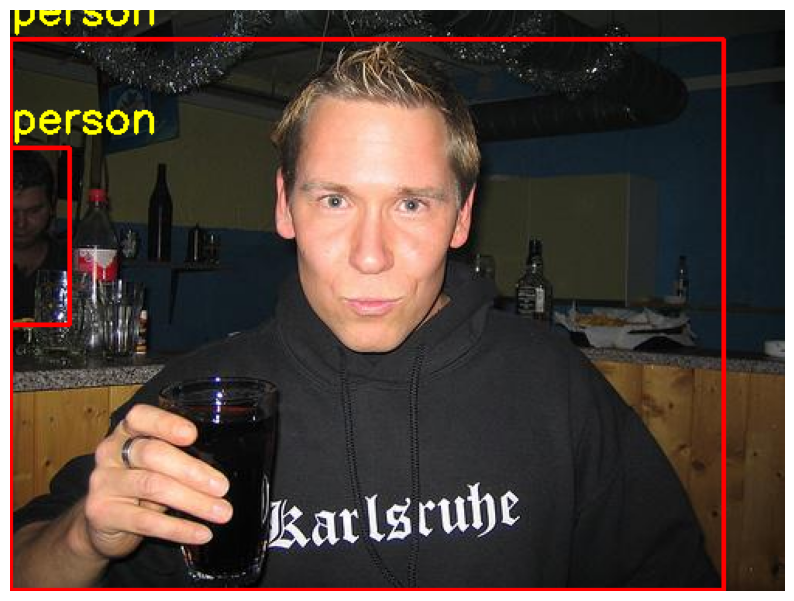

Detected: cat at 56.39141845703125, 63.2956428527832, 420.71661376953125, 278.14459228515625


/home/samsepi0l/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


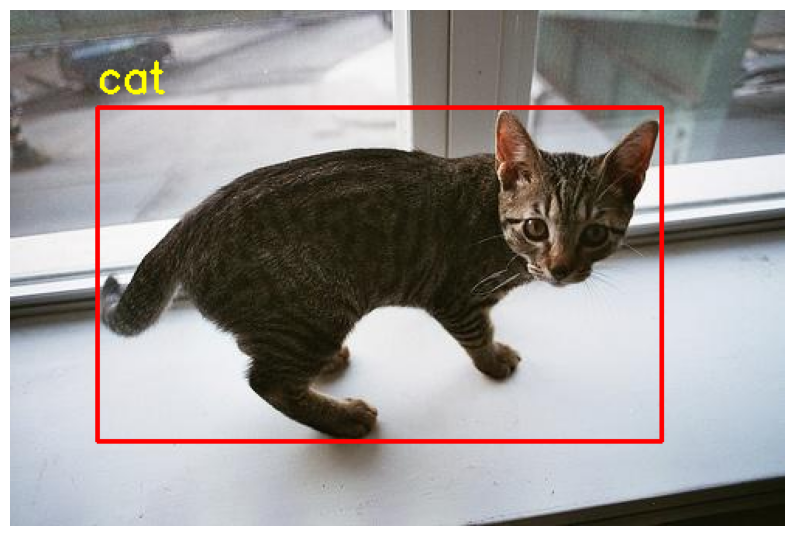

/home/samsepi0l/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


Detected: cat at 2.118241786956787, 50.07379150390625, 335.2455749511719, 498.7639465332031


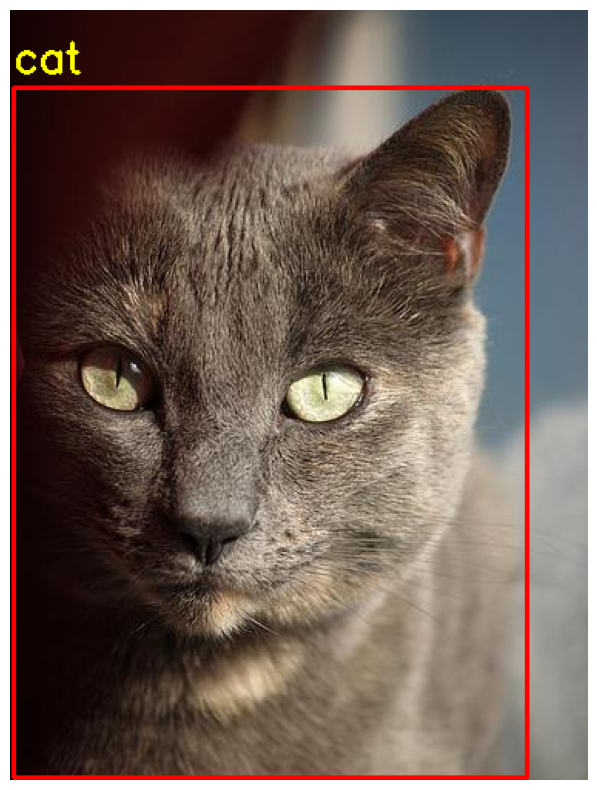

In [5]:
# Load the YOLOv5x model
model_5x = torch.hub.load('ultralytics/yolov5', 'yolov5x')

# Define the folder containing the images
image_folder = Path('/home/samsepi0l/TErm 7/CV/yolo/ex1')

# Get the list of image files
image_files = [f for f in os.listdir(image_folder) if f.endswith('.jpg')][:5]

# Define the target classes
target_classes = ['person', 'cat']

# Process each image file
for image_file in image_files:
    img_path = str(image_folder / image_file)
    results = model_5x(img_path)
    detections = results.pandas().xyxy[0]
    filtered = detections[detections['name'].isin(target_classes)]

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for matplotlib
    
    for _, row in filtered.iterrows():
        print(f"Detected: {row['name']} at {row['xmin']}, {row['ymin']}, {row['xmax']}, {row['ymax']}")
        # Draw bounding box
        cv2.rectangle(img, (int(row['xmin']), int(row['ymin'])), (int(row['xmax']), int(row['ymax'])), (255, 0, 0), 2)
        cv2.putText(img, row['name'], (int(row['xmin']), int(row['ymin']) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 255, 0), 2)

    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    plt.axis('off')  # Hide axes
    plt.show()

Exercise 1: Modify the code to display only specific classes (e.g., only 'person' or 'car') in the detection results.

Exercise 2: (Advanced): Train YOLOv5 on a custom dataset by following the YOLOv5 fine-tuning instructions. Test the trained model on new images.

In [55]:
!curl -L "https://public.roboflow.com/ds/hUZnsukUAO?key=I4c5bF0ZKQ" -o -y roboflow.zip
!unzip roboflow.zip
!rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   911  100   911    0     0   1418      0 --:--:-- --:--:-- --:--:--  1416
100 16.8M  100 16.8M    0     0  1699k      0  0:00:10  0:00:10 --:--:-- 1980k
curl: (6) Could not resolve host: roboflow.zip
unzip:  cannot find or open roboflow.zip, roboflow.zip.zip or roboflow.zip.ZIP.
rm: cannot remove 'roboflow.zip': No such file or directory


In [58]:
!mv robolow yolov5/data/Chess-data

mv: cannot stat 'robolow': No such file or directory


In [12]:
!python yolov5/train.py --img 416 --batch 16 --epochs 50 --data ./Chess-data/data.yaml --weights yolov5m.pt --device 0

/home/samsepi0l/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "
2024-12-22 12:56:51.720284: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1734865011.732207   83661 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1734865011.735739   83661 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5m.pt, cfg=, data=./Chess-data/data.yam

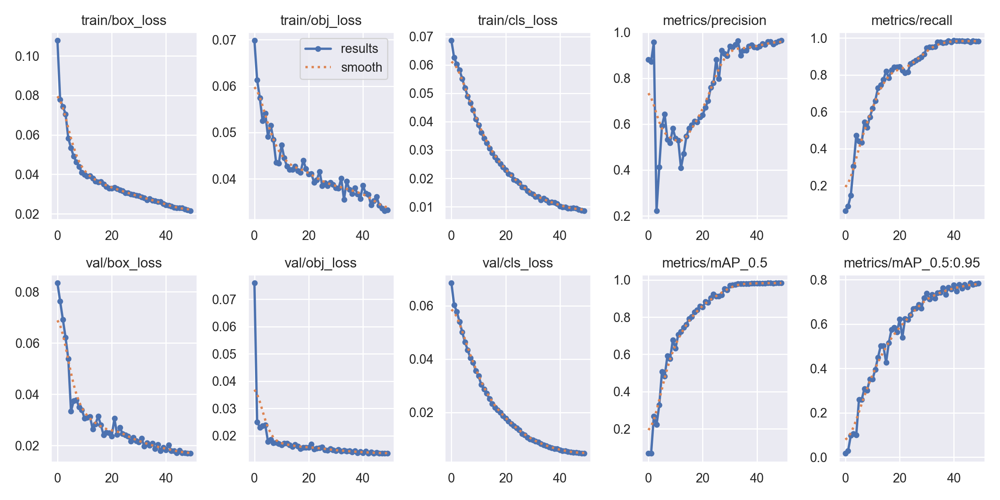

In [13]:
from IPython.display import Image
Image(filename='yolov5/runs/train/exp6/results.png')

In [22]:
!python yolov5/detect.py --weights yolov5/runs/train/exp6/weights/best.pt --img 416 --conf 0.4 --source yolov5/data/Chess-data/test/images

/home/samsepi0l/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "
detect: weights=['yolov5/runs/train/exp6/weights/best.pt'], source=yolov5/data/Chess-data/test/images, data=yolov5/data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
fatal: cannot change to '/home/samsepi0l/TErm': No such file or directory
YOLOv5

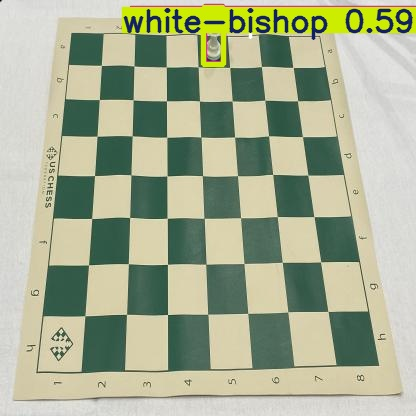

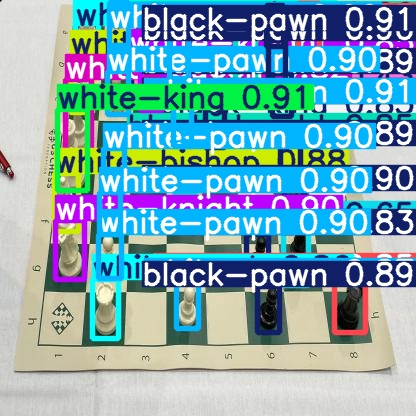

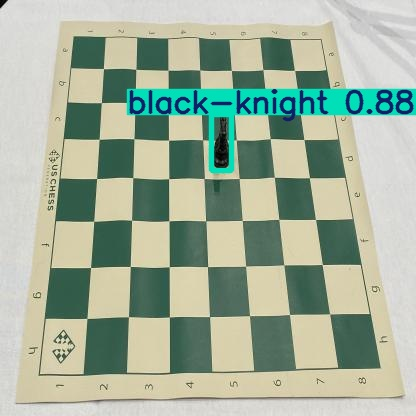

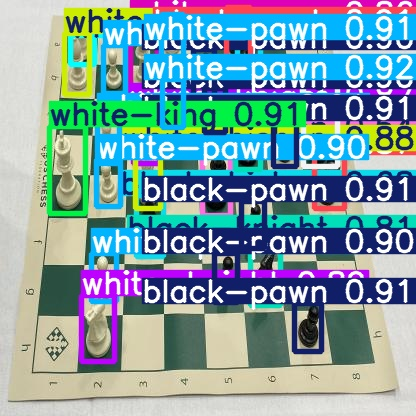

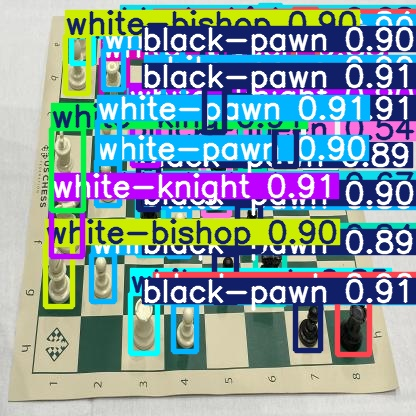

...

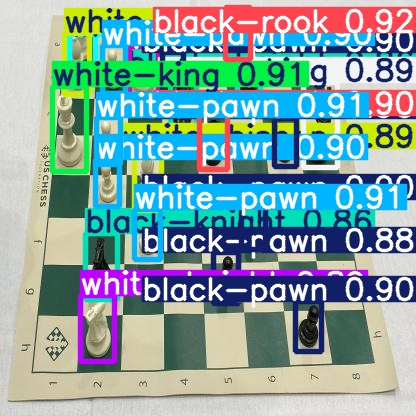

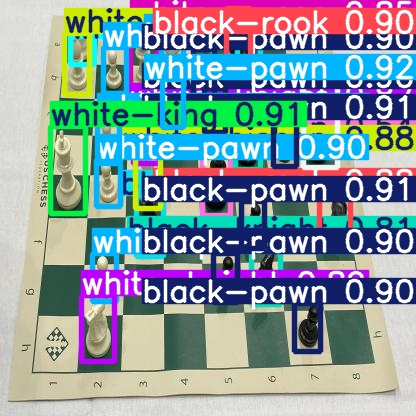

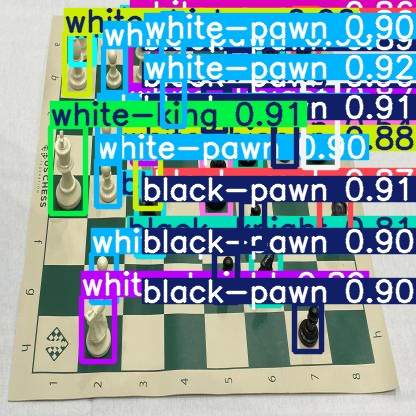

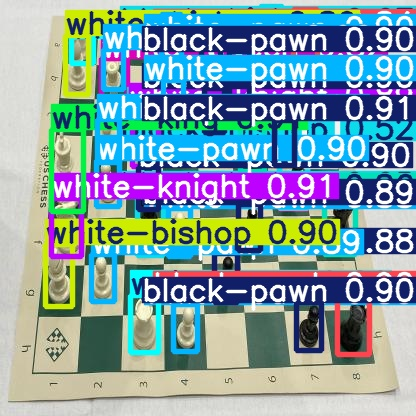

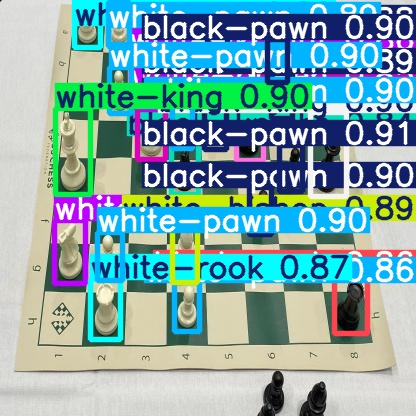

In [31]:
import os
from IPython.display import display

image_folder = 'yolov5/runs/detect/exp8'
for image_file in os.listdir(image_folder):
    if image_file.endswith('.jpg'):
        display(Image(filename=os.path.join(image_folder, image_file), width=600))
        